In [4]:
import cv2
import matplotlib.pyplot as plt
import deepdish as dd
import numpy as np
from util.reconstruction import Class_3D
from util.reconstruction import demark
from util import helper

import numpy.linalg as nl
from scipy.spatial.distance import pdist, cdist, squareform
from scipy.stats import multivariate_normal

# sensor_id = "W00"
sensor_id = "Fabric"
model_id = "RGB"
model_fn = f"models/LUT_{sensor_id}_{model_id}.pkl"
c3d = Class_3D(model_fn=model_fn, features_type=model_id)

def imshow(im, vmin=0, vmax=1):
    plt.imshow(im[:,:,::-1], vmax=vmax, vmin=vmin)
    plt.show()

# frames = dd.io.load("data/fabric_soft_gripper.h5")
# frames = dd.io.load("data/fabric2.h5")
frames1 = dd.io.load("data/fabric_0319.h5")
frames2 = dd.io.load("data/fabric_0319_1.h5")

In [5]:
frame0 = frames1[0]
frame0_blur = cv2.GaussianBlur(frame0, (45, 45), 0)

In [ ]:
# np.save("data/fabric_soft_gripper.npy", frames)

In [6]:
frames_1 = np.array(frames1)
frames_2 = np.array(frames2)
centered = frames_1[np.array([0, 330, 340, 360, 370, 420, 440, 460, 620, 960, 980, 1420, 1480, 1880, 2150, 2190, 180, 200, 210, 220, 490, 520, 540, 585, 600, 1380, 1550, 2330, 2560, 2570, 2580, 90, 100, 390, 400, 830, 860, 890, 910, 940, 950, 1830, 1900, 1960, 2030, 2050, 2080, 2130, 2140, 2290, 2340, 2360, 2480, 110, 120, 130, 160, 550, 570]), :, :, :]
left_1 = frames_1[np.array([0, 310, 320, 1330, 1360, 1570, 1790, 640, 800, 990, 1000, 1750, 1780, 2600]), :, :, :]
left_2 = frames_2[np.array([0, 40, 80, 360, 370, 390]), :, :, :]
right_1 = frames_1[np.array([0, 2380, 2390, 2370, 2360, 2400, 2410, 2420, 2430]), :, :, :]
right_2 = frames_2[np.array([0, 440, 460, 510, 520, 550, 560, 570, 580, 590, 600, 610, 620, 640, 650, 660]), :, :, :]
all_1 = frames_1[np.array([0, 1690, 1680, 1700, 1720, 1090, 1140, 1170, 1190, 1210, 1290, 1580, 1590, 1620, 660, 670, 690, 710, 720, 740, 750, 760, 780, 1050, 240, 250, 260, 280, 650, 790, 1010, 1310, 1610]), :, :, :]
all_2 = frames_2[np.array([0, 140, 220, 280, 290, 300, 330, 350, 90, 100, 110, 130]), :, :, :]


In [ ]:
np.save("data/0319_labeled_all2.npy", all_2)

In [ ]:
len(frames)

In [ ]:
# frames = dd.io.load("data/fabric_soft_gripper.h5")
imshow(frame0_blur)

In [29]:
import imutils
from numpy import sin, cos
from scipy import ndimage

# depth => RGB image with Lambertian assumption
def render(depth, k=0.35):
    gy, gx = np.gradient(depth)

    rendered_img = np.zeros(frame.shape)
    theta_x = np.arctan(gx*5)
    theta_y = np.arctan(gy*5)
    
    g = 1.3-np.random.random()*.2 # 1.2
    b = .5-np.random.random()*.2 # .5
    r = 1.1-np.random.random()*.2 # .9
    rendered_img[:,:,1] = np.cos(np.pi / 2 - theta_x) * k * 1.2
    rendered_img[:,:,0] = np.cos(np.pi / 2 + theta_y) * k * 0.5
    rendered_img[:,:,2] = np.cos(np.pi / 2 - theta_y) * k * 0.9

    rendered_img[:,:,1] += 0.03
    return rendered_img

# blur of the boundaries
def blend(img, mask, rng=30):
    distance = ndimage.distance_transform_edt(1 - mask)
    distance_clip = 1 / (1 + np.exp(-(distance - rng) / 10)) 

    distance_clip = 1 - distance_clip
    distance_clip_RGB = np.dstack([distance_clip, distance_clip, distance_clip])

    img_blur = cv2.GaussianBlur(img, (185,185), 0)

    img_mix = distance_clip_RGB * img_blur + (1 - distance_clip_RGB) * img
    return img_mix

# transform the depth
def transform(depth, theta, dx, dy, depth_max=10):    
    rows, cols = depth.shape[:2]
    
    depth_img = np.dstack([depth / depth_max] * 3)


    M = cv2.getRotationMatrix2D((cols/2, rows/2), theta, 1)
    M[:, 2] += [dx, dy]

    shifted = cv2.warpAffine(depth_img, M, (cols, rows))

#     generate mask
    mask = np.ones(depth_img.shape)
    mask = cv2.warpAffine(mask, M, (cols, rows))

    mask = 1 - mask[:,:,0]
    
    return shifted, mask, M

# visualization
def draw_line(img, theta, x0, y0):
    theta = theta / 180. * np.pi
    img = img.copy()
    rows, cols = img.shape[:2]
    
    center = np.array([x0 * cols, y0 * rows])
    
    d = 1100
    
    start_point = center + (d * sin(theta), d * cos(theta))
    end_point = center - (d * sin(theta), d * cos(theta))
    
    start_point = tuple(start_point.astype(np.int))
    end_point = tuple(end_point.astype(np.int))

    color = (0, 0, 1)
    thickness = 4
    
    img = cv2.line(img, start_point, end_point, color, thickness) 
    return img

# frame0 = frames[0]
# # frame = frames[280]
# # frame = frames[460]

# frame = frames[200]
# # frame = frames[375]
# # frame = frames[455]


def makeT(cp):
    # cp: [K x 2] control points
    # T: [(K+3) x (K+3)]
    K = cp.shape[0]
    T = np.zeros((K+3, K+3))
    T[:K, 0] = 1
    T[:K, 1:3] = cp
    T[K, 3:] = 1
    T[K+1:, 3:] = cp.T
    R = squareform(pdist(cp, metric='euclidean'))
    R = R * R
    R[R == 0] = 1 # a trick to make R ln(R) 0
    R = R * np.log(R)
    np.fill_diagonal(R, 0)
    T[:K, 3:] = R
    return T

def liftPts(p, cp):
    # p: [N x 2], input points
    # cp: [K x 2], control points
    # pLift: [N x (3+K)], lifted input points
    N, K = p.shape[0], cp.shape[0]
    pLift = np.zeros((N, K+3))
    pLift[:,0] = 1
    pLift[:,1:3] = p
    R = cdist(p, cp, 'euclidean')
    R = R * R
    R[R == 0] = 1
    R = R * np.log(R)
    pLift[:,3:] = R
    return pLift

def draw_markers(img):
    # source control points
    # x, y = np.linspace(120, 280, 3), np.linspace(90, 210, 3)
    x, y = np.linspace(120, 280, 2), np.linspace(90, 210, 2)
    x, y = np.meshgrid(x, y)
    xs = x.flatten()
    ys = y.flatten()
    cps = np.vstack([xs, ys]).T

    # target control points
    xt = xs + np.random.uniform(-35, 35, size=xs.size)
    yt = ys + np.random.uniform(-35, 35, size=ys.size)

    # construct T
    T = makeT(cps)

    # solve cx, cy (coefficients for x and y)
    xtAug = np.concatenate([xt, np.zeros(3)])
    ytAug = np.concatenate([yt, np.zeros(3)])
    cx = nl.solve(T, xtAug) # [K+3]
    cy = nl.solve(T, ytAug)

    # dense grid
    # N = 30
    x = np.linspace(5, 375, 14)
    y = np.linspace(15, 280, 10)
    x, y = np.meshgrid(x, y)
    xgs, ygs = x.flatten(), y.flatten()
    gps = np.vstack([xgs, ygs]).T
    
    # Gaussian
    x_gauss = np.linspace(-1, 1, 14)
    y_gauss = np.linspace(-1, 1, 10)
    x_gauss, y_gauss = np.meshgrid(x_gauss, y_gauss)
    R = np.sqrt(x_gauss**2 + y_gauss**2)
    Z = ((1. / np.sqrt(2 * np.pi)) * np.exp(-.5*R**2))
    Zs = Z.flatten()

    # transform
    pgLift = liftPts(gps, cps) # [N x (K+3)]

    nxg = np.dot(pgLift, cx.T)
    nyg = np.dot(pgLift, cy.T)
    xgt = np.multiply(nxg - xgs, Zs) + xgs
    ygt = np.multiply(nyg - ygs, Zs) + ygs
    
    for i in range(len(xgt)):
        cv2.circle(img, (int(xgt[i]), int(ygt[i])), 5, (50, 50, 60), -1)
#         cv2.circle(img, (int(xgt[i]), int(ygt[i])), 5, 1, -1)


X = []
Y = []
# frames = frames1

def augment(frame_ind, x0, y0, theta0, category=1):
    
    frame = frames[frame_ind]  
    frame_prev = frames[frame_ind-np.random.randint(1, 20)] 
    diff = (frame * 1.0 - frame0_blur) / 255. + 0.5
    diff_prev = (frame_prev * 1.0 - frame0_blur) / 255. + 0.5
#     diff_small = cv2.resize(diff, (120, 90))
#     diff_magnified = (diff - 0.5) * 4 + 0.5

    # Get depth
    depth_prev, gx, gy = c3d.infer(diff_prev * 255.0, demark=demark, display=False)
    depth, gx, gy = c3d.infer(diff * 255.0, demark=demark, display=False)
#     depth, gx, gy = c3d.infer(diff * 255.0, display=False)

    # Transform
    theta = 30
    dx, dy = 20, 0
    depth_max = 1

    rows, cols = frame.shape[:2]
#     rows, cols = diff_small.shape[:2]

    x, y = np.arange(rows), np.arange(cols)
    yy, xx = np.meshgrid(y, x)
    
#     # for downsampled depth image:
#     x0 *= 120/400
#     y0 *= 120/400

#     for i in range(1000):
    for i in range(200):
#     for i in range(1):
        if category == 1:
            theta = np.random.random() * 90 - 45
            dx, dy = np.random.random() - 0.5, np.random.random() - 0.5
            dx, dy = dx * cols * 0.4, dy * rows * 0.4
        elif category == 2 or category == 3:
            theta = np.random.random() * 60 - 30
            dx, dy = np.random.random() - 0.8, np.random.random() - 0.5
            dx, dy = dx * cols * 0.1, dy * rows * 0.2
        elif category == 4:
            theta = np.random.random() * 60 - 30
            dx, dy = np.random.random() - 0.2, np.random.random() - 0.5
            dx, dy = dx * cols * 0.1, dy * rows * 0.2
        else:
            dx = 0
            dy = 0
            theta = 0
        
#         

        #     depth_augmented = (depth)
        ddepth = depth.max() * np.random.random() * 0.4
        depth_augmented = (depth - ddepth) 
        depth_augmented = np.maximum(depth_augmented, 0)
        depth_augmented_prev = (depth_prev - ddepth*(np.random.random()+0.5)) 
        depth_augmented_prev = np.maximum(depth_augmented_prev, 0)

        shifted, mask, M = transform(depth_augmented, theta, dx, dy, depth_max=depth_max)
        shifted_prev, mask, M = transform(depth_augmented_prev, theta, dx, dy, depth_max=depth_max)
        
        img_mix = blend(shifted, mask)
        img_mix_prev = blend(shifted_prev, mask)
#         rendered_img = render(img_mix[:, :, 0] * depth_max, k=0.42-np.random.random()*.35)

#         noise = np.random.normal(0, 0.03, size=rendered_img.shape)
#         rendered_img += noise
        
    
        
#         # add markers to non-difference rendering
#         diff2 = (rendered_img - 0.5) * 0.25 + 0.5
#         rendered_img = ((diff2 - 0.5)*255).astype(np.uint8) + frame0_blur
# #         draw_markers(rendered_img)
        
#         rendered_diff = ((rendered_img * 1.0 - frame0_blur) / 255. * 4.0 + 0.5) + .5
#         draw_markers(rendered_diff)
# #         rendered_diff = rendered_diff/255. * 4.0 + 0.5
    
        #     draw line
        theta1 = theta0 + theta

        while theta1 > 180:
            theta1 -= 360
        while theta1 < -180:
            theta1 += 360
            
            
        
        X0 = np.array([[x0], [y0], [1.]])
        X1 = M.dot(X0)
        x1, y1 = X1[0, 0] / cols, X1[1, 0] / rows
        
        # depth image stuff
        noise = np.random.normal(0, 0.03, size=shifted.shape)
        shifted += noise
        noise = np.random.normal(0, 0.03, size=shifted.shape)
        shifted_prev += noise
        depth_small = cv2.resize(shifted, (120, 90))
        depth_small_prev = cv2.resize(shifted_prev, (120, 90))
#         print(depth_small.size)
        cat = category
        if cat == 3:
            cat = 1
        elif cat == 4:
            cat = 1
        if cat == 1 and x1 < 0 and ((y[1]+y[0]*np.tan(y[2]/180. *np.pi)) < 0.2 or (y[1]+y[0]*np.tan(y[2]/180. *np.pi)) > 0.8):
            cat = 2
            
            
        depth3 = np.dstack([depth] * 3)
#         X.append(shifted)
        X.append([depth_small_prev, depth_small])
        Y.append([x1, y1, theta1, cat])

#         #     plt.figure()
# #         rendered_img_line = draw_line(rendered_img + 0.5, theta1, x1, y1)
        

#         rendered_small = cv2.resize(rendered_diff, (120, 90))
# #         rendered_small = cv2.resize(rendered_diff, (120, 90))
#         #     imshow(rendered_small)
        
# #         print(np.max(rendered_small))
        

#         X.append(rendered_small)
#         Y.append([x1, y1, theta1])

        if i % 100 == 0:
            print(frame_ind)
    #     imshow(rendered_img + 0.5)

    #     imshow(rendered_img_line)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


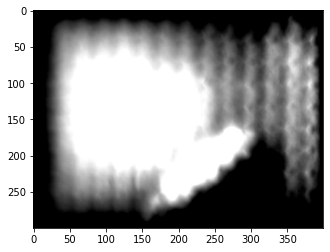

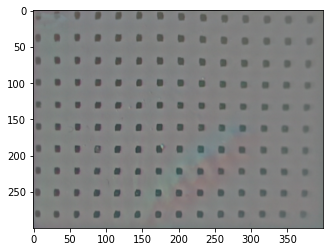

In [25]:
frame = frames1[2340]
diff = (frame * 1.0 - frame0_blur) / 255. + 0.5
diff_magnified = (diff - 0.5) * 4 + 0.5
depth, gx, gy = c3d.infer(diff * 255.0, demark=demark, display=False)


# diff_small = cv2.resize(diff, (120, 90))
ddepth = depth.max() * np.random.random() * 0.4
depth_augmented = (depth - ddepth) 

depth3 = np.dstack([depth_augmented] * 3)
imshow(depth3)
imshow(diff)

# theta0 = -5.787
# x0, y0 = (79.5, 151.0)
# rows, cols = frame.shape[:2]

# # # labeled image
# rendered_img_line = draw_line(frame , theta0, x0 / cols, y0 / rows)
# imshow(rendered_img_line)


In [30]:
X = []
Y = []

# centered images:
# frames = dd.io.load("data/fabric_0319.h5")
frames = frames1
augment(330, 59.5, 143.5, 8.781, 1)
augment(340, 82.0, 150.5, 14.813, 1)
augment(360, 125.0, 140.0, 9.951, 1)
augment(370, 146.5, 145.0, 13.822, 1)
augment(420, 171.0, 173.0, -6.499, 1)
augment(440, 159.0, 173.0, -5.262, 1)
augment(460, 146.0, 171.5, -2.472, 1)
augment(620, 96.5, 179.0, 30.486, 1)
augment(960, 178.0, 168.5, -15.161, 1)
# augment(980, 91.0, 123.0, -22.109, 1) # 10
augment(1420, 155.0, 166.0, -3.691, 1)
augment(1480, 124.5, 136.0, -9.075, 1)
augment(1880, 165.5, 172.5, -20.799, 1)
augment(2150, 180.0, 166.5, -17.281, 1)
augment(2190, 139.0, 153.0, -33.275, 1)
augment(180, 76.0, 146.0, -13.851, 1)
augment(200, 53.0, 147.5, -4.433, 1)
augment(210, 39.5, 140.5, -5.937, 1)
augment(220, 24.5, 140.5, -2.925, 1)
# augment(490, 119.0, 170.0, -5.262, 1) # 20
augment(520, 107.5, 169.0, -12.284, 1)
augment(540, 112.5, 155.0, -6.203, 1)
augment(585, 104.5, 193.5, 26.39, 1)
augment(600, 94.5, 188.5, 32.542, 1)
augment(1380, 81.0, 147.5, -3.614, 1)
augment(1550, 77.0, 184.5, 15.388, 1)
augment(2330, 177.5, 204.0, -46.9, 1)
augment(2560, 133.0, 132.0, 4.236, 1)
augment(2570, 96.0, 132.0, 0.0, 1)
# augment(2580, 50.0, 132.0, -4.399, 1) # 30
augment(90, 95.5, 152.5, -4.185, 1)
augment(100, 96.0, 160.0, -4.764, 1)
augment(390, 162.0, 156.5, 6.282, 1)
augment(400, 167.5, 174.5, 0.451, 1)
augment(830, 102.0, 151.0, -14.036, 1)
augment(860, 169.5, 154.0, -13.473, 1)
augment(890, 204.0, 160.0, -1.123, 1)
augment(910, 233.0, 123.5, 0.0, 1)
augment(940, 247.0, 132.0, 18.083, 1)
# augment(950, 234.0, 155.0, 0.0, 1) # 40
augment(1830, 145.0, 162.5, -6.39, 1)
augment(1900, 180.5, 156.5, -21.886, 1)
augment(1960, 215.5, 130.5, -3.424, 1)
augment(2030, 184.5, 123.5, 31.13, 1)
augment(2050, 215.5, 92.0, 34.743, 1)
augment(2080, 246.5, 75.5, 39.289, 1)
augment(2130, 231.5, 159.5, -3.552, 1)
augment(2140, 203.5, 158.5, -10.337, 1)
augment(2290, 175.0, 176.0, -47.49, 1)
# augment(2340, 213.5, 214.0, -48.559, 1) # 50
augment(2360, 252.0, 247.0, -53.13, 1)
augment(2480, 213.5, 113.5, 48.846, 1)
augment(110, 99.5, 139.5, -6.766, 1)
augment(120, 99.0, 149.0, -6.419, 1)
augment(130, 94.5, 157.5, -2.06, 1)
augment(160, 91.5, 162.0, -9.176, 1)
augment(550, 105.0, 169.0, 0.881, 1)
augment(570, 102.0, 178.5, 16.204, 1)
augment(310, 19.5, 151.5, 8.267, 3)
# augment(320, 48.5, 165.0, 12.68, 3) # 60
augment(1330, 9.0, 113.5, -0.902, 3)
augment(1360, 51.0, 136.5, 2.224, 3)
augment(1570, 34.0, 158.0, -6.981, 3)
augment(1790, 89.0, 159.0, 11.56, 3)
augment(640, 39.0, 153.5, -12.011, 3)
augment(800, 42.5, 158.0, -14.903, 3)
augment(990, 46.0, 140.0, -18.677, 3)
augment(1000, 26.0, 99.0, -15.461, 3)
augment(1750, 25.5, 148.5, 12.319, 3)
# augment(1780, 64.5, 152.0, 7.125, 3) # 70
augment(2600, 26.5, 145.5, -6.973, 3)
augment(2380, 319.5, 229.0, -49.87, 4)
augment(2390, 332.5, 249.0, -49.79, 4)
augment(2370, 281.5, 239.0, -52.9, 4)
augment(2360, 256.5, 231.0, -47.42, 4)
augment(2400, 350.5, 227.5, -38.884, 4)
augment(2410, 363.5, 190.0, -25.408, 4)
augment(2420, 317.5, 182.5, -1.254, 4)
augment(2430, 297.0, 149.5, 12.819, 4)
augment(1690, 0, 150, 0, 2) # 80
augment(1680, 0, 150, 0, 2)
augment(1700, 0, 150, 0, 2)
augment(1720, 0, 150, 0, 2)
augment(1090, 0, 150, 0, 2)
augment(1140, 0, 150, 0, 2)
augment(1170, 0, 150, 0, 2)
augment(1190, 0, 150, 0, 2)
augment(1210, 0, 150, 0, 2)
augment(1290, 0, 150, 0, 2)
# augment(1580, 0, 150, 0, 2) # 90
augment(1590, 0, 150, 0, 2)
augment(1620, 0, 150, 0, 2)
augment(660, 0, 150, 0, 2)
augment(670, 0, 150, 0, 2)
augment(690, 0, 150, 0, 2)
augment(710, 0, 150, 0, 2)
augment(720, 0, 150, 0, 2)
augment(740, 0, 150, 0, 2)
augment(750, 0, 150, 0, 2)
# augment(760, 0, 150, 0, 2) # 100
augment(780, 0, 150, 0, 2)
augment(1050, 0, 150, 0, 2)
augment(1010, 0, 150, 0, 2)
augment(1310, 0, 150, 0, 2)
augment(1610, 0, 150, 0, 2)
augment(240, 0, 150, 0, 2)
augment(250, 0, 150, 0, 2)
augment(260, 0, 150, 0, 2)
augment(280, 0, 150, 0, 2)
# augment(650, 0, 150, 0, 2) # 110
augment(790, 0, 150, 0, 2)

# frames = dd.io.load("data/fabric_0319_1.h5")
frames = frames2
augment(40, 35.5, 177.5, -8.715, 3)
augment(80, 26.5, 221.5, 20.638, 3)
augment(360, 28.5, 17.5, -45.0, 3)
augment(370, 42.0, 46.5, -41.743, 3)
augment(390, 76.5, 119.5, -39.848, 3)
augment(440, 265.5, 150.5, -29.89, 4)
augment(460, 276.0, 143.5, -13.092, 4)
augment(510, 324.5, 132.5, 31.961, 4)
# augment(520, 333.5, 120.0, 34.004, 4) # 120
augment(550, 337.5, 110.5, 24.291, 4)
augment(560, 377.5, 114.5, 17.56, 4)
augment(570, 380.0, 127.5, 8.637, 4)
augment(580, 365.5, 128.5, 23.523, 4)
augment(590, 346.5, 156.5, 5.412, 4)
augment(600, 332.5, 136.5, -8.924, 4)
augment(610, 333.0, 155.5, -14.407, 4)
augment(620, 334.5, 146.0, -18.239, 4)
augment(640, 350.5, 163.5, 6.47, 4)
# augment(650, 366.0, 165.0, 14.931, 4) # 130
augment(660, 373.5, 164.0, 11.427, 4)
augment(140, 0, 150, 0, 2)
augment(220, 0, 150, 0, 2)
augment(280, 0, 150, 0, 2)
augment(290, 0, 150, 0, 2)
augment(300, 0, 150, 0, 2)
augment(330, 0, 150, 0, 2)
augment(350, 0, 150, 0, 2)
augment(90, 0, 150, 0, 2)
# augment(100, 0, 150, 0, 2) # 140
augment(110, 0, 150, 0, 2)
augment(130, 0, 150, 0, 2)
augment(670, 0, 150, 0, 0)
augment(680, 0, 150, 0, 0)
augment(700, 0, 150, 0, 0)
augment(720, 0, 150, 0, 0)
augment(730, 0, 150, 0, 0)
augment(750, 0, 150, 0, 0)
augment(770, 0, 150, 0, 0)
# augment(780, 0, 150, 0, 0) # 150
augment(800, 0, 150, 0, 0)
augment(810, 0, 150, 0, 0)
augment(820, 0, 150, 0, 0)
augment(830, 0, 150, 0, 0)
augment(840, 0, 150, 0, 0)

330
330
340
340
360
360
370
370
420
420
440
440
460
460
620
620
960
960
1420
1420
1480
1480
1880
1880
2150
2150
2190
2190
180
180
200
200
210
210
220
220
520
520
540
540
585
585
600
600
1380
1380
1550
1550
2330
2330
2560
2560
2570
2570
90
90
100
100
390
390
400
400
830
830
860
860
890
890
910
910
940
940
1830
1830
1900
1900
1960
1960
2030
2030
2050
2050
2080
2080
2130
2130
2140
2140
2290
2290
2360
2360
2480
2480
110
110
120
120
130
130
160
160
550
550
570
570
310
310
1330
1330
1360
1360
1570
1570
1790
1790
640
640
800
800
990
990
1000
1000
1750
1750
2600
2600
2380
2380
2390
2390
2370
2370
2360
2360
2400
2400
2410
2410
2420
2420
2430
2430
1690
1690
1680
1680
1700
1700
1720
1720
1090
1090
1140
1140
1170
1170
1190
1190
1210
1210
1290
1290
1590
1590
1620
1620
660
660
670
670
690
690
710
710
720
720
740
740
750
750
780
780
1050
1050
1010
1010
1310
1310
1610
1610
240
240
250
250
260
260
280
280
790
790
40
40
80
80
360
360
370
370
390
390
440
440
460
460
510
510
550
550
560
560
570
570
580
58

In [ ]:
X = []
Y = []

# fabric2.h5 labeled images
# augment( 150 , 206.5 , 127.0 , -5.404 )
# augment( 175 , 217.5 , 100.5 , 1.606 )
# augment( 200 , 223.0 , 134.0 , 0.744 )
# augment( 225 , 287.0 , 165.5 , 19.911 )
# augment( 250 , 259.0 , 121.0 , -17.301 )
# augment( 275 , 241.5 , 160.5 , 28.191 )
# augment( 300 , 233.0 , 122.5 , 17.008 )
# augment( 325 , 221.0 , 111.5 , 13.925 )
# augment( 350 , 243.0 , 156.5 , 17.03 )
# augment( 375 , 183.5 , 131.5 , -29.89 )
# augment( 400 , 223.5 , 159.0 , 39.333 )
# augment( 425 , 232.5 , 123.0 , 24.555 )
# augment( 450 , 208.5 , 117.5 , -14.744 )
# augment( 475 , 197.0 , 138.0 , -5.356 )
# augment( 500 , 215.5 , 186.5 , 29.694 )
# augment( 525 , 281.5 , 171.0 , 28.269 )
# augment( 550 , 194.0 , 136.0 , -9.09 )
# augment( 575 , 188.0 , 163.0 , 28.56 )
# augment( 600 , 216.0 , 171.0 , 28.142 )
# augment( 650 , 190.5 , 223.0 , 46.515 )
# augment( 625 , 138.5 , 157.5 , -1.185 )



# fabric_soft_gripper.h5 labeled images
# augment(400, 163.5, 165.0, -2.474)
# augment(425, 170.5, 170.0, 1.432)
# augment(450, 163.5,  171.0,  1.228)
# augment(490, 109.5,  175.5,  -6.0332)
# augment(520, 94.5,  169.5,  -1.153)
augment(550, 79.5, 151.0, -5.787)
# augment(575, 94.0, 147.0, -1.878)
# augment(600, 157.0, 139.0, -16.336)
# augment(650, 258.5, 141.5, 3.652)
# augment(700, 290.5, 143.0, 3.453)
# augment(750, 273.0, 175.5, -19.784)
# augment(800, 257.5, 142.0, -12.339)
# augment(850, 276.5, 178.0, -11.239)
# augment(900, 297.5, 142.5, -11.547)
# augment(950, 188.0, 156.5, -18.898)
# augment(625, 215.5, 151.0, -3.453)
# augment(675, 269.5, 148.0, 3.576)
# augment(725, 343.5, 137.5, -0.437)
# augment(775, 251.0, 176.0, -17.266)
# augment(825, 265.0, 167.5, -13.459)
# augment(875, 274.0, 174.5, -14.568)
# augment(925, 236.5, 172.0, -30.763)
# augment(975, 288.5, 143.5, 5.906)
# augment(974, 268.0, 160.0, 12.225)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


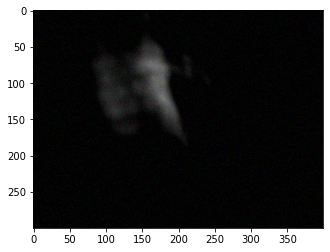

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


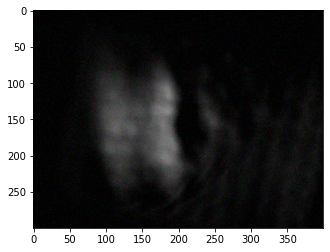

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


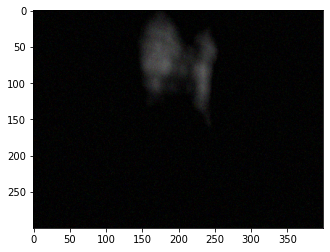

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


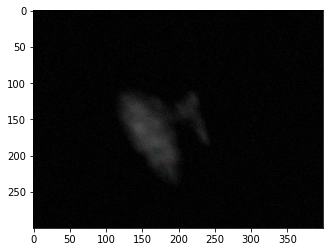

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


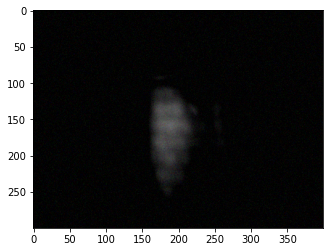

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


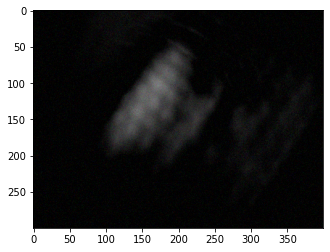

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


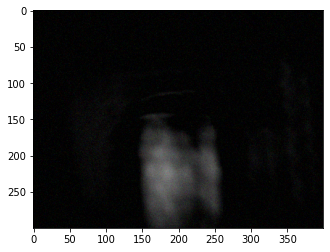

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


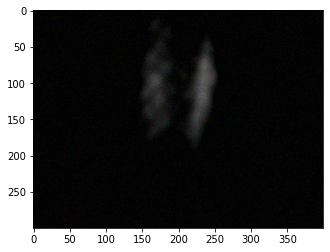

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


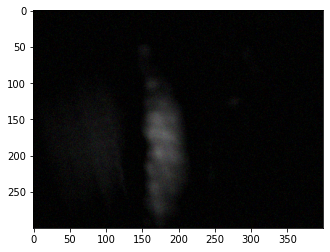

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


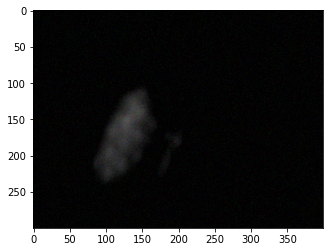

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


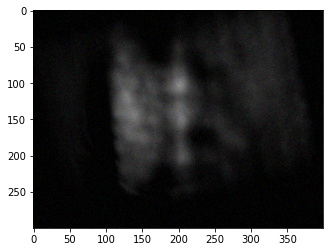

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


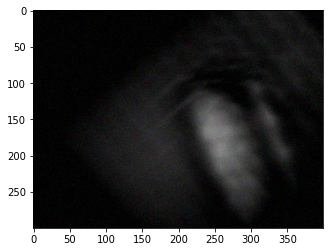

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


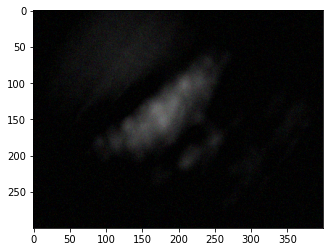

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


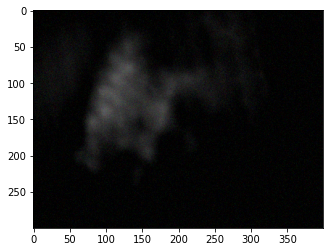

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


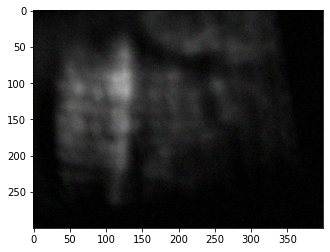

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


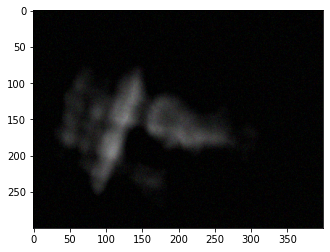

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


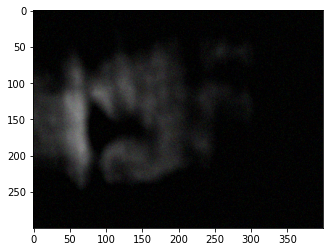

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


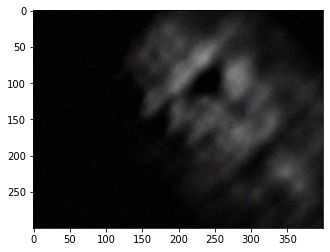

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


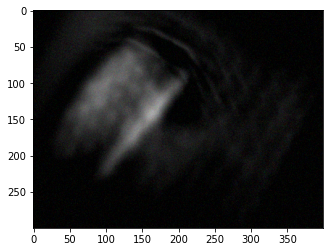

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


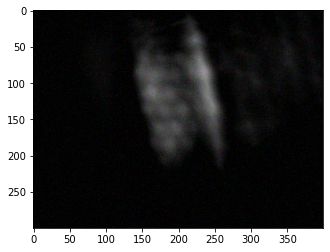

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


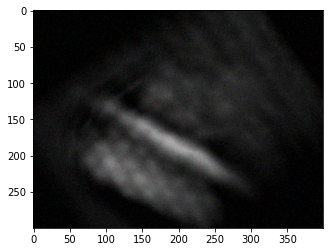

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


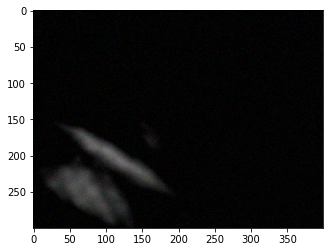

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


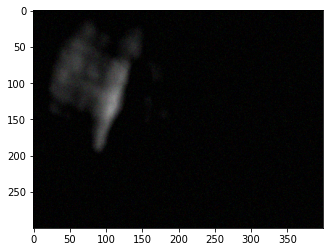

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


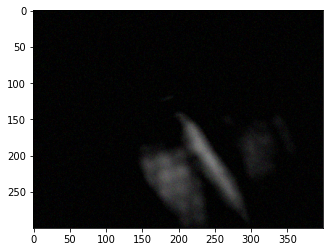

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


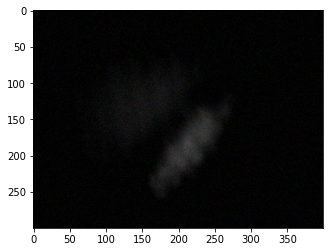

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


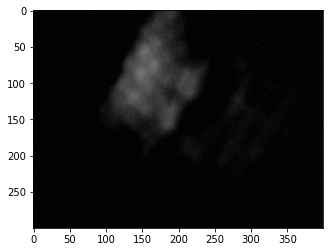

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


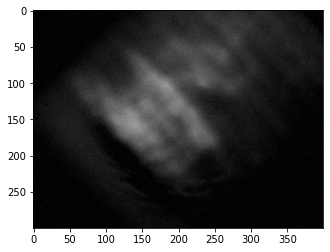

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


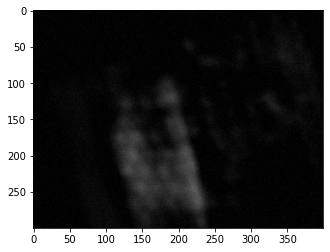

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


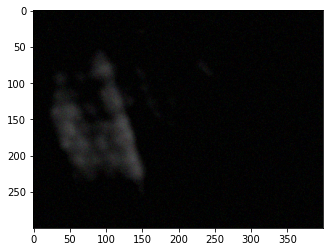

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


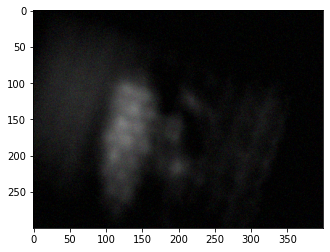

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


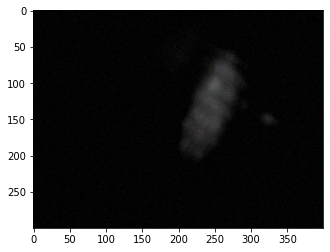

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


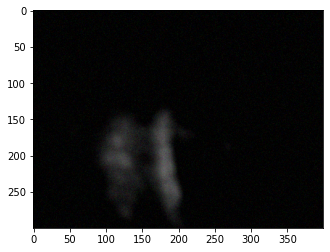

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


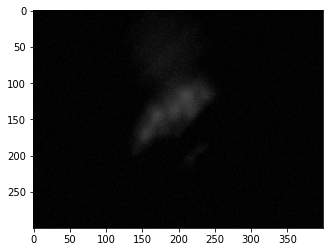

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


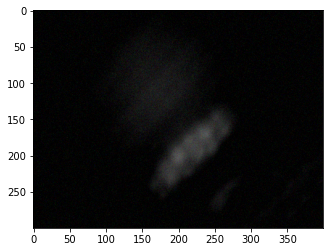

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


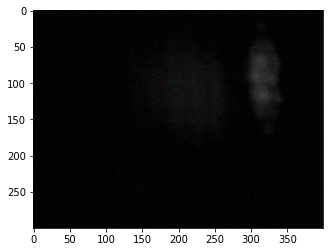

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


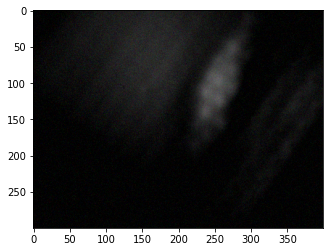

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


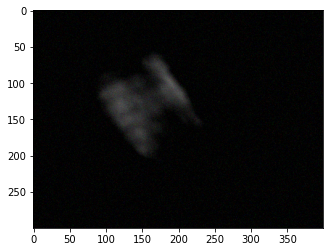

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


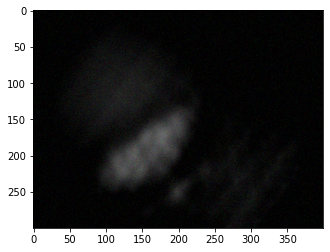

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


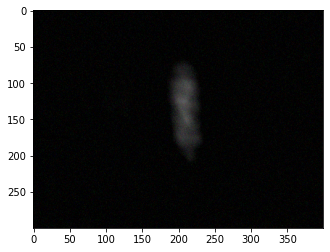

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


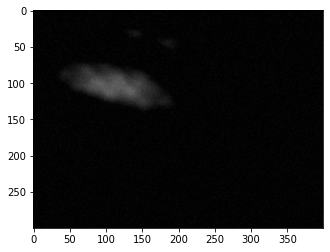

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


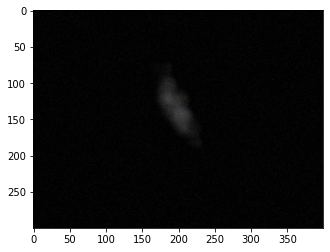

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


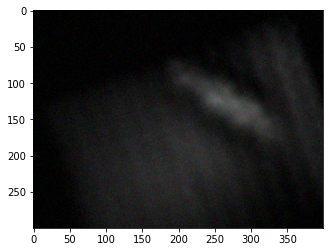

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


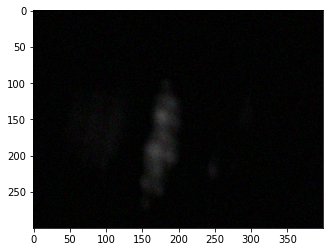

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


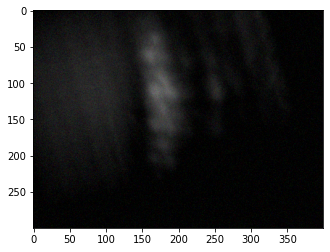

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


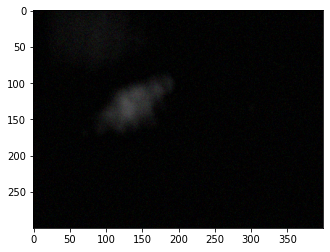

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


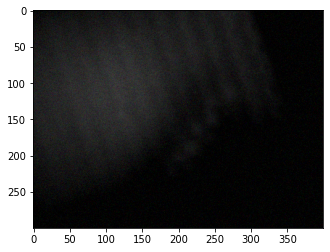

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


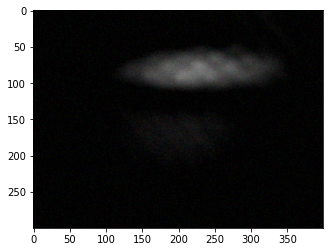

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


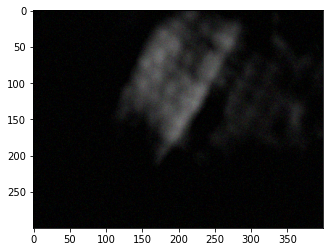

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


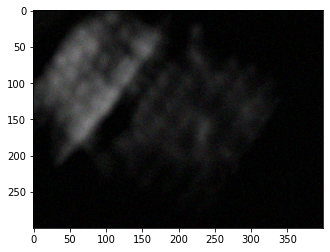

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


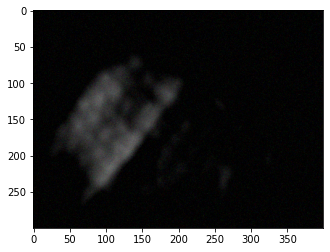

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


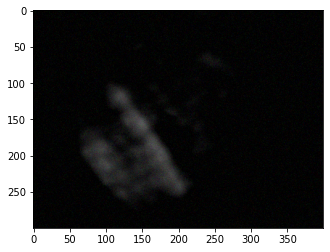

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


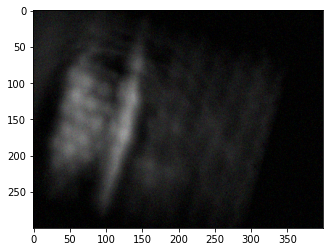

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


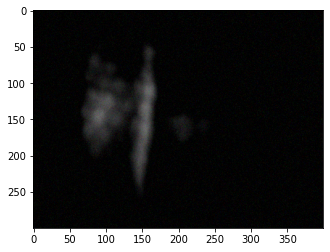

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


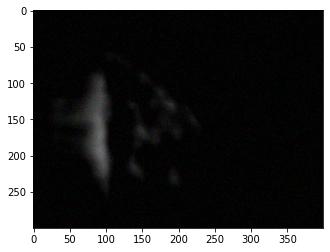

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


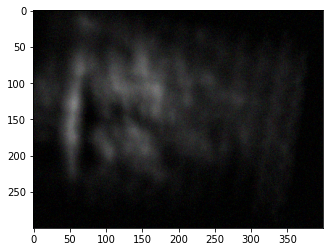

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


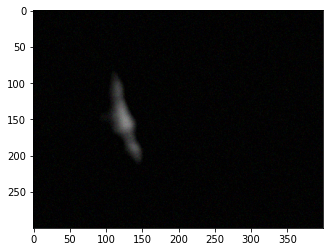

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


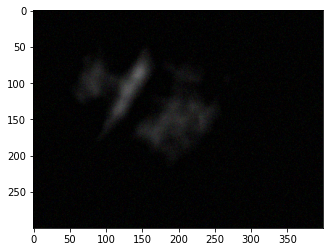

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


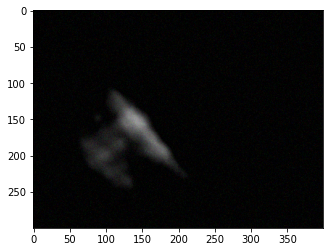

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


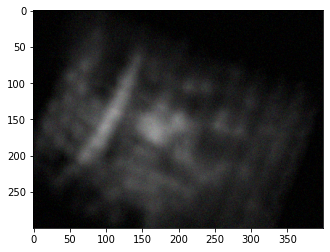

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


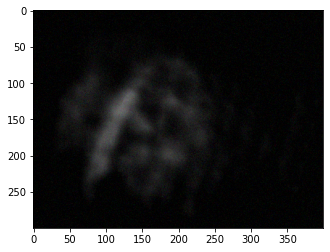

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


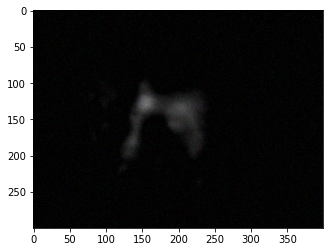

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


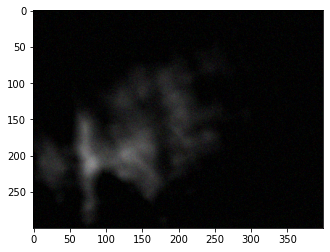

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


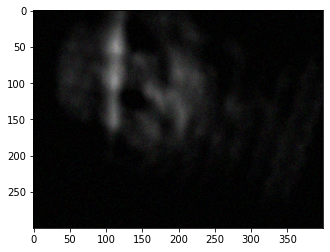

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


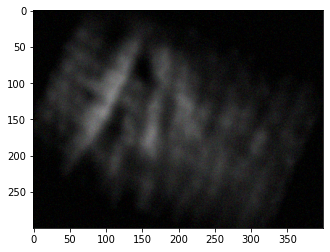

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


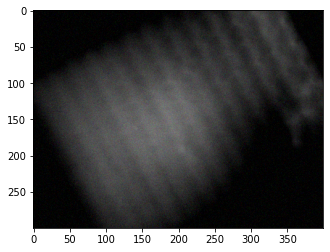

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


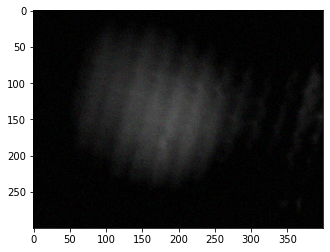

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


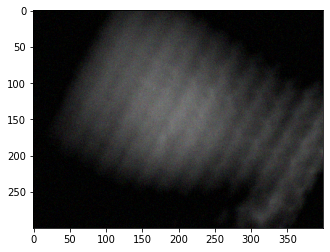

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


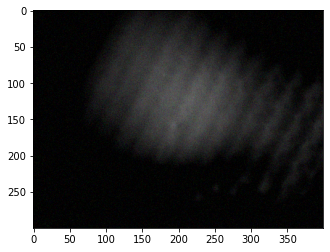

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


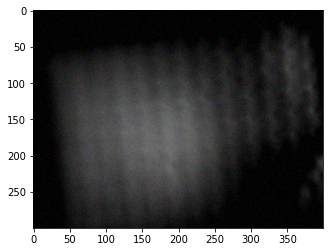

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


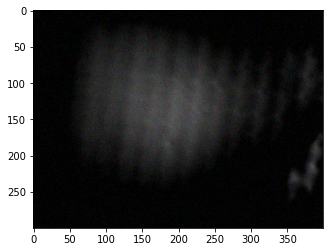

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


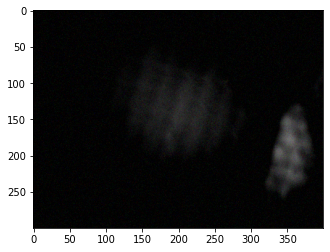

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


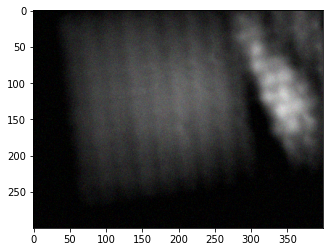

In [28]:
count = 0

for x, y in zip(X, Y):
#     init = cv2.resize(x[0], (400, 300))
#     imshow(init)
#     x = cv2.resize(x[1], (400, 300))
#     rendered_img_line = draw_line(x, y[2], y[0], y[1])
#     imshow(rendered_img_line)
#     count += 1
#     print(count, ": ", y[3])
    imshow(x)

    

In [ ]:
# 9, 50, 60, 71, 72, 73, 74, 75, 76, 79, 112, 113, 114, 

frame = frames[325]

diff = (frame * 1.0 - frame0_blur) / 255. * 1.0 + 0.5
diff_magnified = (diff - 0.5) * 4 + 0.5

imshow(diff_magnified)

# diff = (frame * 1.0 - frame0) / 255. + 0.5
# diff_img = (diff - 0.5) * 4 + 0.5

mask = helper.find_marker(diff * 255, threshold_list=(80, 80, 80))
frame0_background = cv2.bitwise_and(frame0_blur, frame0_blur, mask=cv2.bitwise_not(mask))

diff2 = (diff_magnified - 0.5) * 0.25 + 0.5
rendered = ((diff2 - 0.5)*255).astype(np.uint8) + frame0_background

imshow(rendered)

In [ ]:
theta0 = 20
x0, y0 = (287.0 , 165.5)

# augment( 150 , 206.5 , 127.0 , -5.404 )
# 225 , 287.0 , 165.5 , 19.911

frame = frames[425]
rows, cols = frame.shape[:2]

diff = (frame * 1.0 - frame0_blur) / 255. * 1.0 + 0.5
diff_magnified = (diff - 0.5) * 4 + 0.5

# x = cv2.resize(frame, (400, 300)) / 255.
x = cv2.resize(diff_magnified, (400, 300))
# theta: in degrees
# x0: 0-1 (=>(0, cols))
# y0: 0-1 (=>(0, rows))
rendered_img_line = draw_line(x , theta0, x0 / cols, y0 / rows)
imshow(rendered_img_line)


[]

In [31]:
data = {"X": np.array(X), "Y": np.array(Y)}
dd.io.save("dataset/fabric_pose_class_0423.h5", data)

In [ ]:
frame = frames1[0]
diff = (frame * 1.0 - frame0_blur) / 255. * 4 + 0.5
diff_small = cv2.resize(diff, (120, 90))
imshow(diff_small)
# frame = frames[490]
# diff = (frame * 1.0 - frame0_blur) / 255. * 4 + 0.5
# diff_small = cv2.resize(diff, (120, 90))
# imshow(diff_small)

for _ in range(200, 850, 20):
    frame = frames_1[_]
    diff = (frame * 1.0 - frame0_blur) / 255. * 4 + 0.5
    diff_small = cv2.resize(diff, (120, 90))
    imshow(diff_small)

In [ ]:
frame = frames[468]
    
diff = (frame * 1.0 - frame0_blur) / 255. * 1.0 + 0.5
# diff_magnified = (diff - 0.5) * 4 + 0.5

# Get depth
depth, gx, gy = c3d.infer(diff * 255.0, demark=demark, display=False)

rows, cols = frame.shape[:2]

x, y = np.arange(rows), np.arange(cols)
yy, xx = np.meshgrid(y, x)

theta = 0
dx, dy = 0, 0
depth_augmented = (depth)
depth_max = 10

shifted, mask, M = transform(depth_augmented, theta, dx, dy, depth_max=depth_max)

img_mix = blend(shifted, mask)
rendered_img = render(img_mix[:, :, 0] * depth_max, k=.3)

noise = np.random.normal(0, 0.03, size=rendered_img.shape)
rendered_img += noise


# add markers
# diff2 = (rendered_img - 0.5) * 0.25 + 0.5
# rendered_img = ((diff2 - 0.5)*255).astype(np.uint8) + frame0_blur
# rendered_diff = ((rendered_img * 1.0 - frame0_blur) / 255. * 4 + 0.5) + .5
rendered_img += 0.5
draw_markers(rendered_img)
# rendered_img[:,:,0] = np.clip(rendered_img[:,:,0]*.9, 0, 1)
# rendered_img[:,:,1] = np.clip(rendered_img[:,:,1]*.95, 0, 1)
imshow(rendered_img)

In [ ]:
frame = frames[468]
diff = (frame * 1.0 - frame0_blur) / 255. * 4 + 0.5
diff_small = cv2.resize(diff, (120, 90))
imshow(diff_small)
imshow((diff-rendered_img)*10)
# imshow((rendered_img-diff)*4)